### Imports

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches

%matplotlib inline 
mpl.rcParams['figure.dpi'] = 300

In [3]:
from sklearn.preprocessing import Normalizer

In [4]:
from chart_studio import plotly
import plotly.figure_factory as ff

In [5]:
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 4000

In [6]:
DATA_VERSION = 'v4'

In [7]:
fig_dir = '../' + DATA_VERSION + '-fig/fig-councils/SCCS/'

In [8]:
gov_arch_csv = '../data/' + DATA_VERSION + '/communities_data_prepped.csv'

In [9]:
gov_df = pd.read_csv(gov_arch_csv)

In [10]:
# SCCS only
gov_df = gov_df.loc[gov_df['is_SCCS'] == 1]

In [11]:
gov_df.head()

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocra

# Councils, Courts Analysis 

In [12]:
col_list = list(gov_df.columns.values)
col_list

['Name',
 'Institutions',
 'Mechanism',
 'Notes',
 'Time span',
 'Geography',
 'Size',
 'Source',
 'Metanotes',
 'Heterogeneity ',
 'FC comments',
 'expert check',
 'Time span: Start',
 'Time span: End',
 'SCCS',
 'is_SCCS',
 'decision_making_mechanisms_include_representation',
 'enforcement_mechanisms_include_police',
 'enforcement_mechanisms_include_fines',
 'decision_making_mechanisms_include_coalition',
 'decision_making_mechanisms_include_unanimity',
 'decision_making_mechanisms_include_bureaucracy',
 'enforcement_mechanisms_include_reputational_risk',
 'decision_making_mechanisms_include_petition',
 'enforcement_mechanisms_include_criticism_mocking_joking',
 'decision_making_mechanisms_include_lobbying',
 'access_mechanisms_include_open_political_unit',
 'decision_making_mechanisms_include_gathering',
 'access_mechanisms_include_female_participation',
 'decision_making_mechanisms_include_board_committee',
 'decision_making_mechanisms_include_power_fluidity',
 'decision_making_mec

In [13]:
council_cols = [
    'decision_making_mechanisms_include_council_local',
    'decision_making_mechanisms_include_council_central_'
]

In [14]:
court_col = ['enforcement_mechanisms_include_tribunal_court_']

In [15]:
local_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_local'] == 1)]

In [16]:
local_councils_df[['Name', 'Institutions', 'Mechanism']]

,Name,Institutions,Mechanism
68,Ajie,"Ukai,Council of Elders","Autocratic Leader/Chief (bound),Induction rite..."
71,Samoans,"King,Tumea,Pule,Matai,Fono","King(chief)-as-Figurehead,Autocratic Leader/Ch..."
72,Gilbertese,"Chief,Maneaba Council,Unimane,Island assembly,...","Autocratic Leader/Chief (bound),Gerontocracy,C..."
73,Toda,"Noim,Clan Council,Village Council,Monegar,Etud...","Council (central) ,Council (local),Gerontocrac..."
74,Nicobarese,"Kinem ma,Kavee kunyee,Village Council,Taka-ran...","Autocratic Leader/Chief (bound),Gerontocracy,H..."
77,Thonga (Tsonga),"Numzane,Hubo,Chief,Royal Court,Letikulu,Tindju...","Autocratic Leader/Chief (bound),Council (local..."
78,Ashanti,"Asante Hene,Chief,Queen Mother,Mpanyimfo,Kotok...","Autocratic Leader/Chief (bound),Consultation,H..."
80,Somali,"Islaan,Shir,Boqor,Tribal Council","Magistrate/official,Divine right,Mediation,Cou..."
83,Micmac [Mi'kmaq],"Sagamore,Buoin,Group,Council of Elders,State C...","Magistrate/official,Autocratic Leader/Chief (b..."
84,Hidatsa,"War chief,Peace Chief,Council of Elders,Tribal...","Autocratic Leader/Chief (bound),Gerontocracy,M..."


In [17]:
local_councils_df.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_popularity_,access_mechanisms_include_payment_for_occupying_office,decision

In [18]:
local_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_local'] == 1)]

In [19]:
local_councils_df

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocra

In [20]:
central_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_central_'] == 1)]

In [21]:
central_councils_df[['Name', 'Institutions', 'Mechanism']]

,Name,Institutions,Mechanism
65,Tehuelche,"Gownok (Yank),Collection of chiefs","Autocratic Leader/Chief (bound),Meritocracy,Po..."
66,Tupinamba,"Council of the Chiefs,Chiefs,Paje","Council (central) ,Gerontocracy,Public meeting..."
70,Marquesans,"Haka'iki,Chief's council,Tau'a,Toa,Tuhuka","Autocratic Leader/Chief (bound),Heredity,Merit..."
73,Toda,"Noim,Clan Council,Village Council,Monegar,Etud...","Council (central) ,Council (local),Gerontocrac..."
76,Nama,"Gao-aob,Raad,Mass meeting,Onderkaptein,Gowaba-...","King(chief)-as-Figurehead,Heredity,Consultatio..."
77,Thonga (Tsonga),"Numzane,Hubo,Chief,Royal Court,Letikulu,Tindju...","Autocratic Leader/Chief (bound),Council (local..."
78,Ashanti,"Asante Hene,Chief,Queen Mother,Mpanyimfo,Kotok...","Autocratic Leader/Chief (bound),Consultation,H..."
79,Masai,"Enkigwana,Spokesman","Council (central) ,Gerontocracy,Meritocracy,Ma..."
80,Somali,"Islaan,Shir,Boqor,Tribal Council","Magistrate/official,Divine right,Mediation,Cou..."
81,Ingalik [Deg Xit'an],"Village council ,Leader of the council,Shaman,...","Council (central) ,Tribunal/Court ,Gerontocrac..."


In [22]:
court_df = gov_df[(gov_df['enforcement_mechanisms_include_tribunal_court_'] == 1)] 

In [23]:
court_df

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocra

In [24]:
court_df.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_popularity_,access_mechanisms_include_payment_for_occupying_office,decision

In [25]:
council_df = gov_df[(
    (gov_df['decision_making_mechanisms_include_council_local'] == 1) |
    (gov_df['decision_making_mechanisms_include_council_central_'] == 1)
)]

In [26]:
council_df[council_cols]

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
65,0,1
66,0,1
68,1,0
70,0,1
71,1,0
72,1,0
73,1,1
74,1,0
76,0,1
77,1,1


In [27]:
council_df.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_popularity_,access_mechanisms_include_payment_for_occupying_office,decision

In [28]:
council_df[council_cols].describe()

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
count,22.000000,22.000000
mean,0.545455,0.772727
std,0.509647,0.428932
min,0.000000,0.000000
25%,0.000000,1.000000
50%,1.000000,1.000000
75%,1.000000,1.000000
max,1.000000,1.000000


In [29]:
council_df[council_cols].sum()

decision_making_mechanisms_include_council_local       12
decision_making_mechanisms_include_council_central_    17
dtype: int64

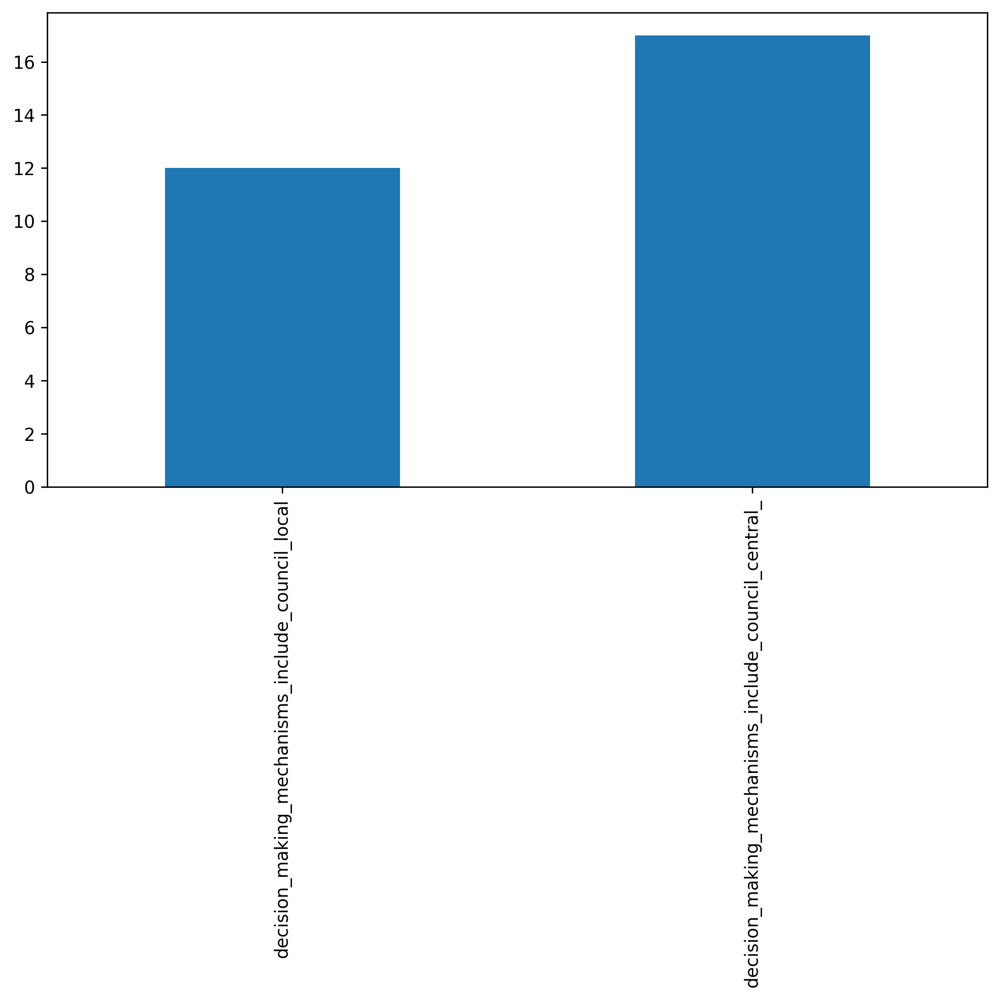

In [30]:
plt.figure(figsize=(8,8))
council_df[council_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'histogram.png')
plt.show()

In [31]:
council_df[['Name'] + council_cols]

,Name,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
65,Tehuelche,0,1
66,Tupinamba,0,1
68,Ajie,1,0
70,Marquesans,0,1
71,Samoans,1,0
72,Gilbertese,1,0
73,Toda,1,1
74,Nicobarese,1,0
76,Nama,0,1
77,Thonga (Tsonga),1,1


## Correlations

In [32]:
data_plot = gov_df.select_dtypes(include=[np.number]).dropna()

In [33]:
data_plot.describe()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_popularity_,access_mechanisms_include_payment_for_occupying_office,decision

In [34]:
normalized = Normalizer().fit_transform(data_plot)

norm_df = pd.DataFrame(normalized)
norm_df.columns = data_plot.columns
norm_corr = norm_df.corr()

norm_corr.head()

,Time span: Start,Time span: End,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_popularity_,access_mechanisms_include_payment_for_occupying_office,decision

In [35]:
councils_corr = norm_corr[council_cols]

In [36]:
councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
Time span: Start,-0.372727,0.080222
Time span: End,0.356562,-0.112581
is_SCCS,0.095453,0.309349
decision_making_mechanisms_include_representation,0.800745,0.201342
enforcement_mechanisms_include_police,-0.178134,0.287499
enforcement_mechanisms_include_fines,0.198494,0.124907
decision_making_mechanisms_include_coalition,NaN,NaN
decision_making_mechanisms_include_unanimity,0.024038,0.281683
decision_making_mechanisms_include_bureaucracy,NaN,NaN
enforcement_mechanisms_include_reputational_risk,-0.184827,0.201815


TODO:
- Councils:
    - Sort and visualize correlations, local
    - Sort and visualize correlations, central
    - Histograms: region, size, time
    - Graph timeline
    - Graph region
- Courts
    - Sort and visualize correlations
    - Histograms: region, size, time
    - Graph timeline
    - Graph region

## Councils Analysis: Local and Central x Mechanisms

In [90]:
plt.figure(figsize=(25,25))
sns.heatmap(
    councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'councils_local_corr.png')
plt.show()

In [38]:
plt.figure(figsize=(25,25))
sns.heatmap(
    councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'councils_central_corr.png')
plt.show()

### Access

In [39]:
access_councils_corr = councils_corr[councils_corr.index.str.startswith('access')]

In [40]:
access_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
access_mechanisms_include_open_political_unit,0.148659,0.242014
access_mechanisms_include_female_participation,-0.041322,0.050102
access_mechanisms_include_induction_rite_ceremony,0.024310,-0.145272
access_mechanisms_include_property_requirement,-0.184827,0.124907
access_mechanisms_include_lottery_random_selection,NaN,NaN
access_mechanisms_include_child_participation,-0.190956,0.050072
access_mechanisms_include_patronage_for_office,NaN,NaN
access_mechanisms_include_meritocracy,-0.195647,-0.062147
access_mechanisms_include_co-optation,NaN,NaN
access_mechanisms_include_screening_process,NaN,NaN


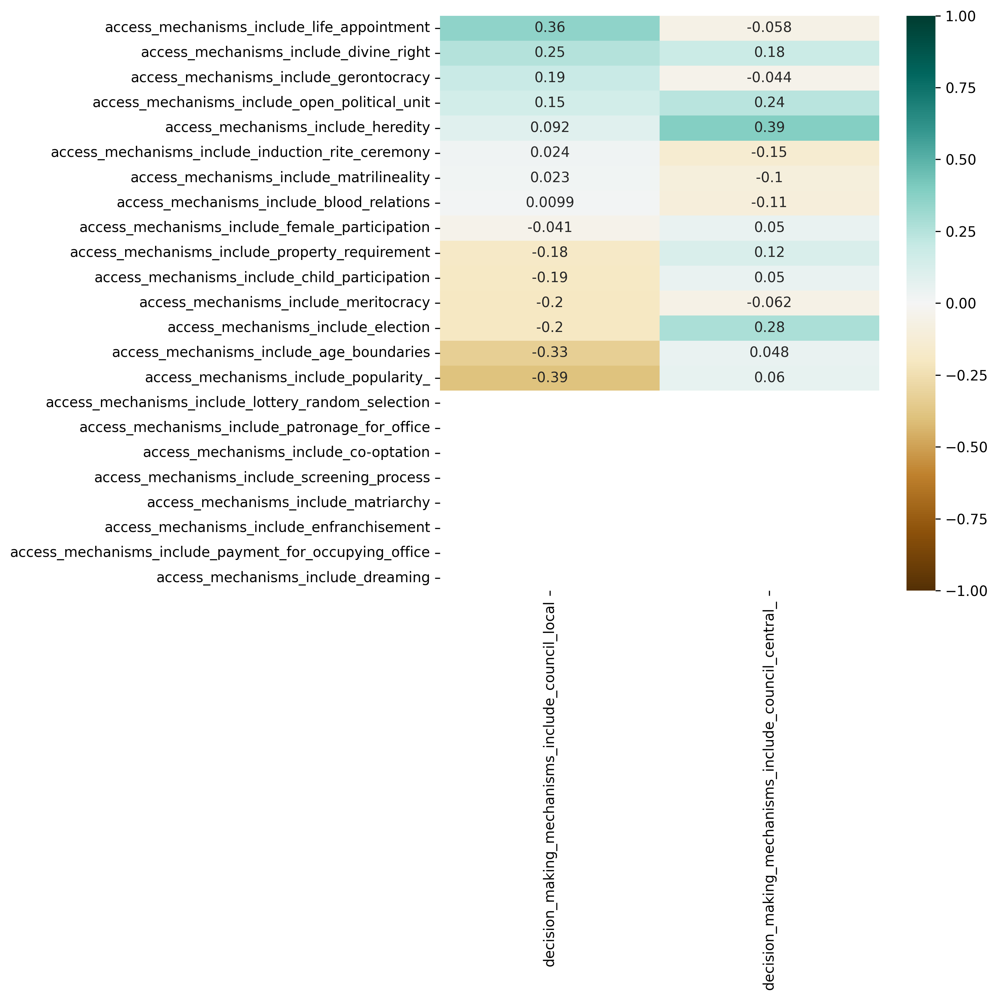

In [41]:
plt.figure(figsize=(10,10))
sns.heatmap(
    access_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'access_councils_local_corr.png')
plt.show()

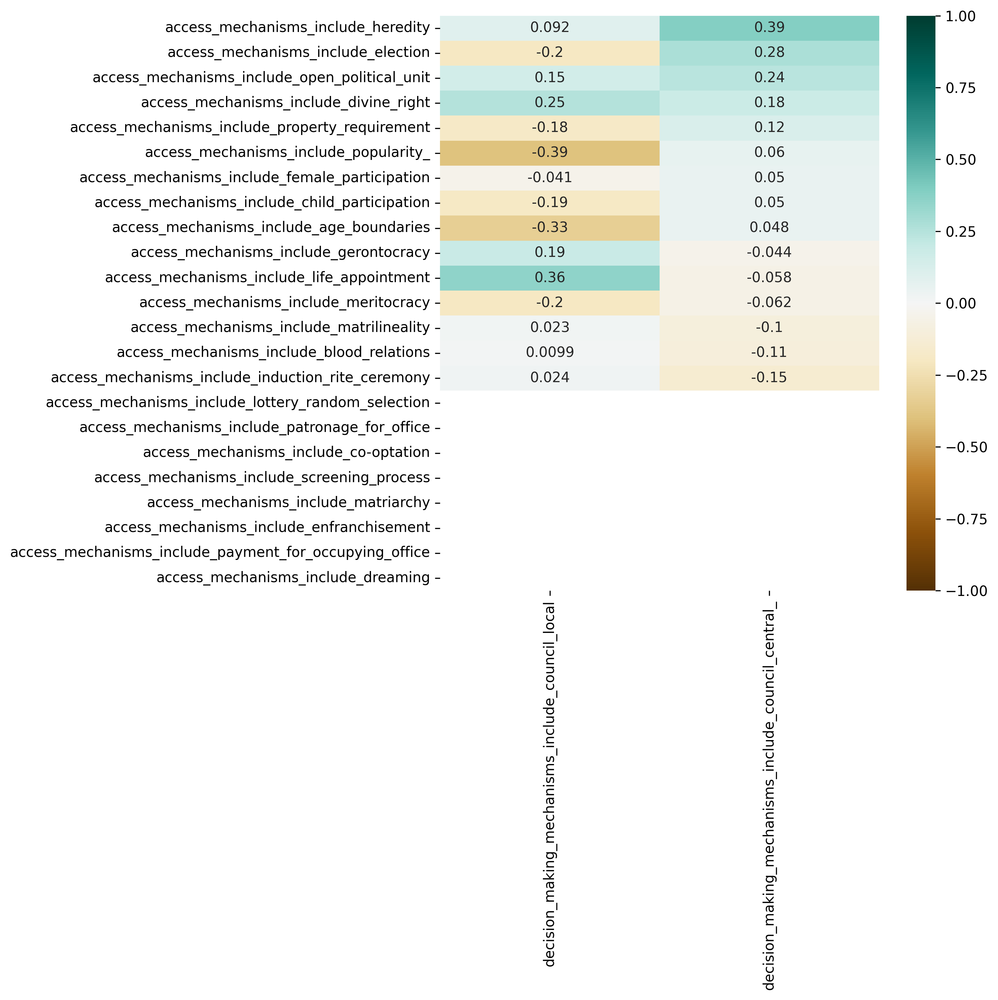

In [42]:
plt.figure(figsize=(10,10))
sns.heatmap(
    access_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'access_councils_central_corr.png')
plt.show()

### Decision Making

In [43]:
dm_councils_corr = councils_corr[councils_corr.index.str.startswith('decision_making')]

In [44]:
dm_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
decision_making_mechanisms_include_representation,0.800745,0.201342
decision_making_mechanisms_include_coalition,NaN,NaN
decision_making_mechanisms_include_unanimity,0.024038,0.281683
decision_making_mechanisms_include_bureaucracy,NaN,NaN
decision_making_mechanisms_include_petition,NaN,NaN
decision_making_mechanisms_include_lobbying,NaN,NaN
decision_making_mechanisms_include_gathering,-0.236349,-0.477893
decision_making_mechanisms_include_board_committee,NaN,NaN
decision_making_mechanisms_include_power_fluidity,NaN,NaN
decision_making_mechanisms_include_frequent_and_or_regular_meetings,0.294132,-0.095456


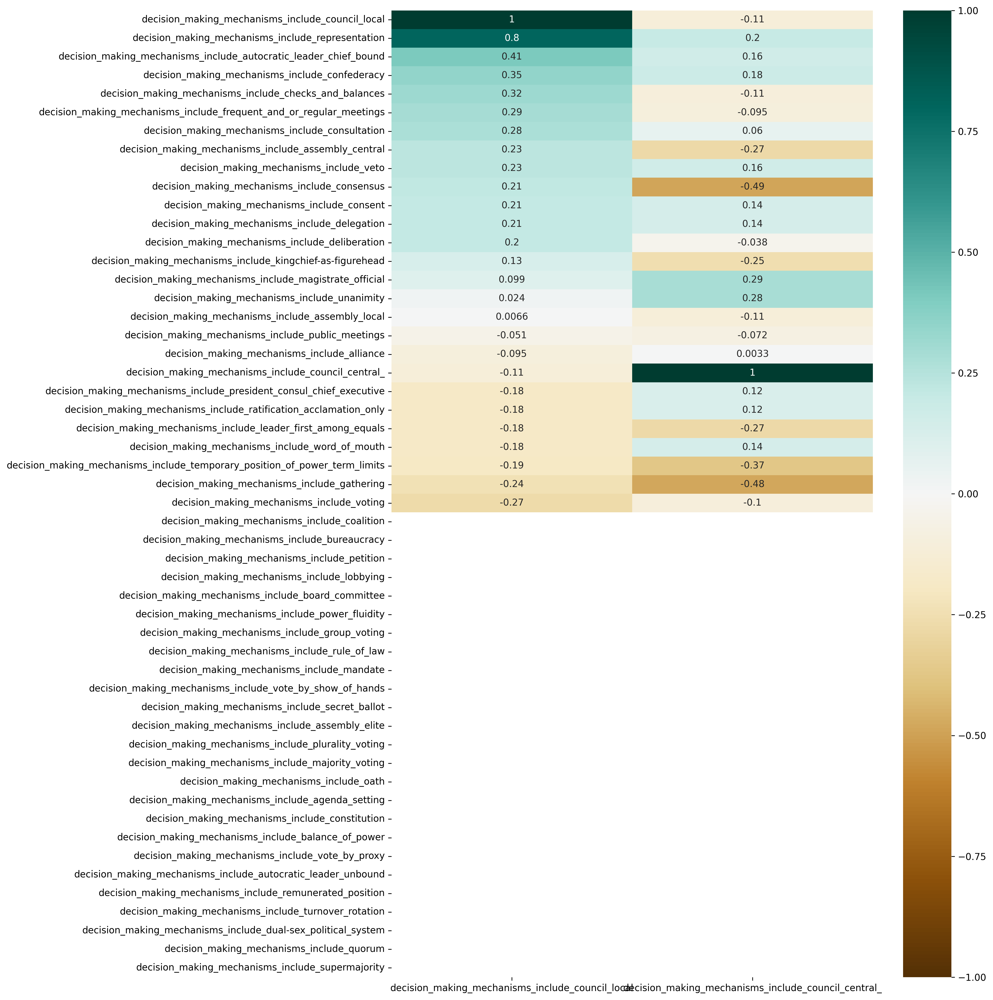

In [45]:
plt.figure(figsize=(15,15))
sns.heatmap(
    dm_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'dm_councils_local_corr.png')
plt.show()

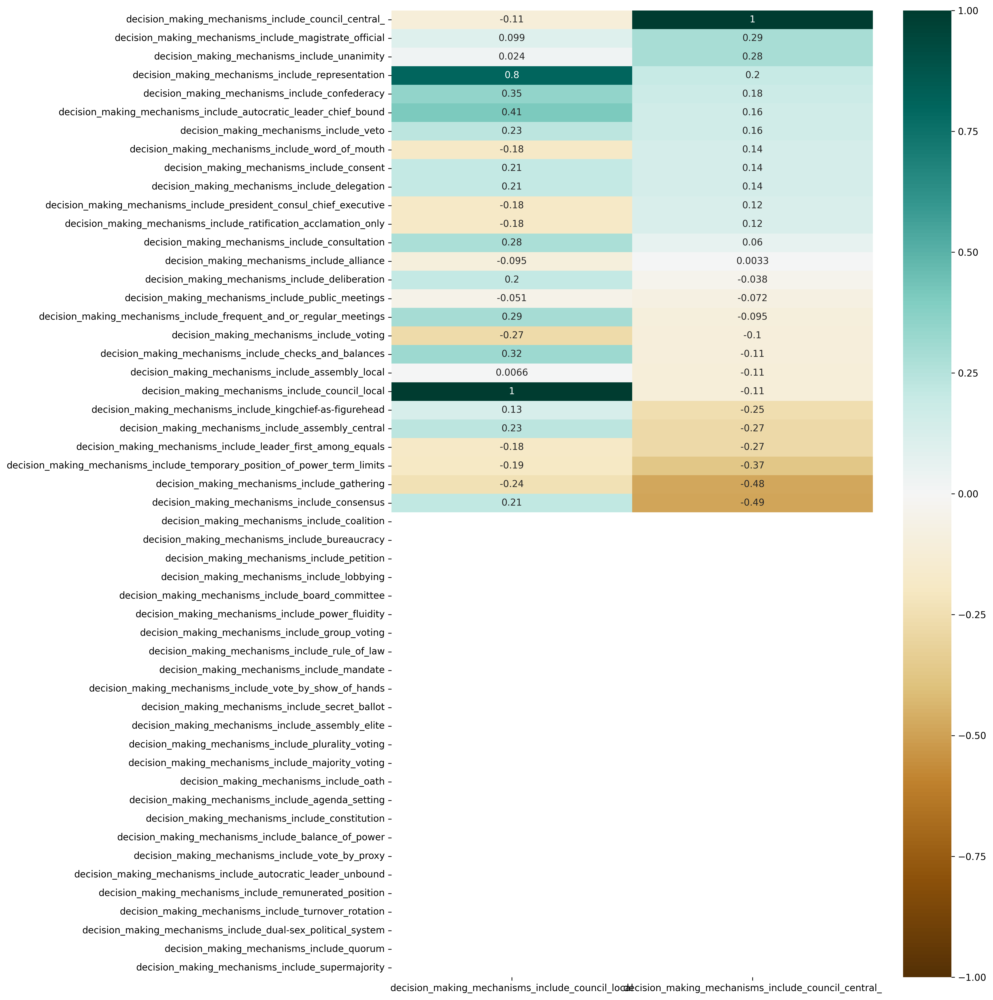

In [46]:
plt.figure(figsize=(15,15))
sns.heatmap(
    dm_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'dm_councils_central_corr.png')
plt.show()

### Enforcement

In [47]:
enforcement_councils_corr = councils_corr[councils_corr.index.str.startswith('enforcement')]

In [48]:
enforcement_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
enforcement_mechanisms_include_police,-0.178134,0.287499
enforcement_mechanisms_include_fines,0.198494,0.124907
enforcement_mechanisms_include_reputational_risk,-0.184827,0.201815
enforcement_mechanisms_include_criticism_mocking_joking,0.198494,0.124907
enforcement_mechanisms_include_monitoring,NaN,NaN
enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,0.009864,-0.107303
enforcement_mechanisms_include_arbitration,0.238071,-0.369951
enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,-0.052663,-0.085504
enforcement_mechanisms_include_exit,0.214061,0.141091
enforcement_mechanisms_include_paying_damages_compensation,NaN,NaN


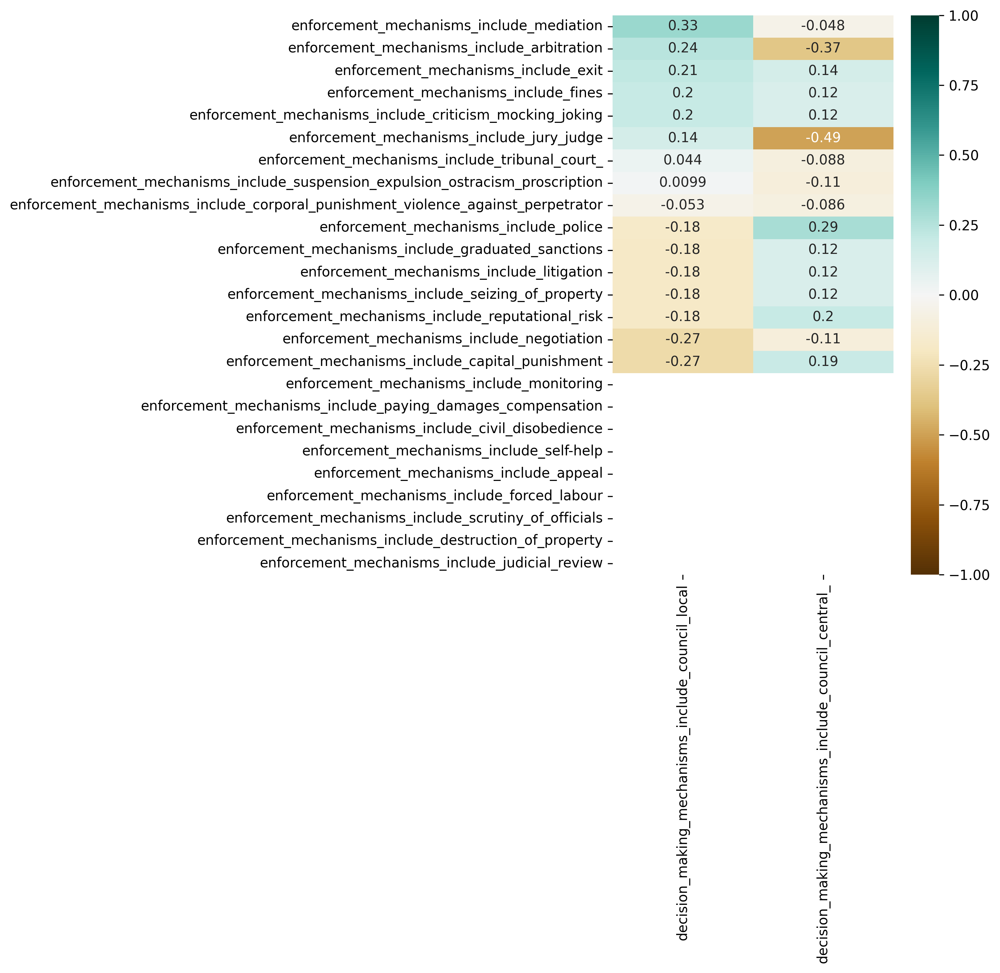

In [49]:
plt.figure(figsize=(10,10))
sns.heatmap(
    enforcement_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'enforcement_councils_local_corr.png')
plt.show()

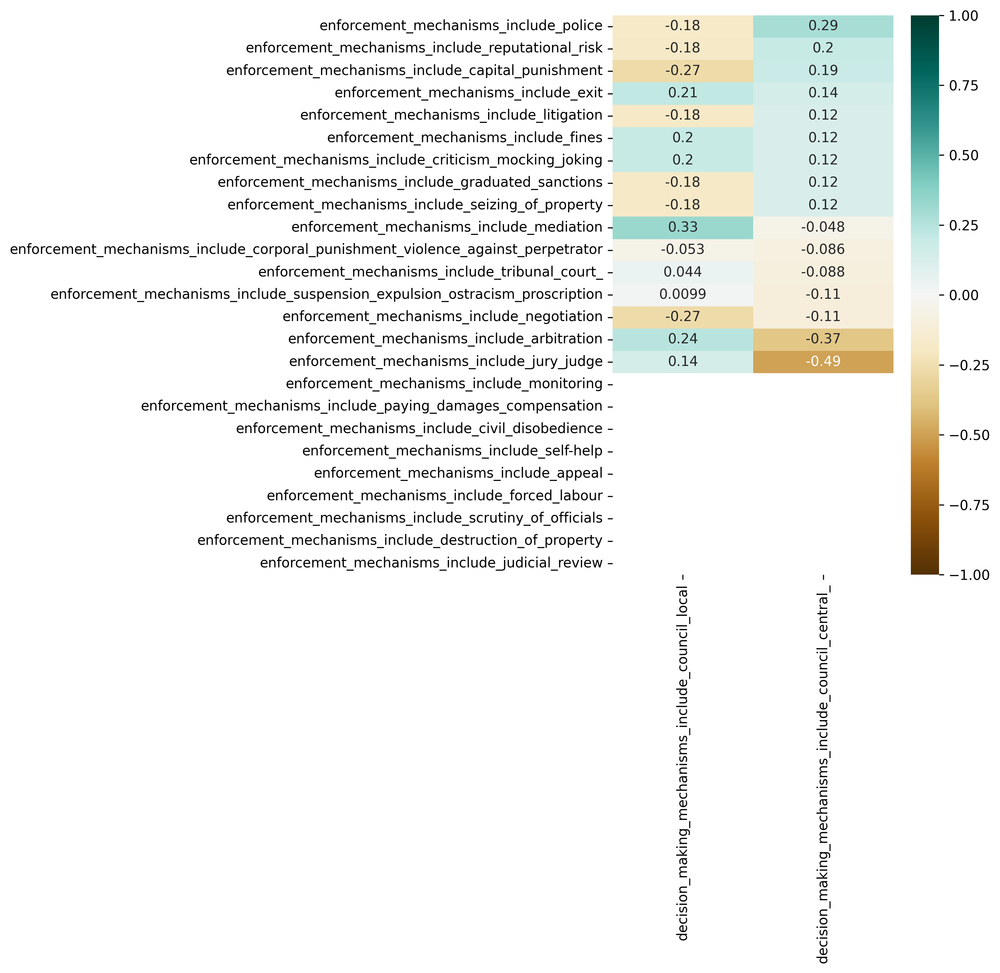

In [50]:
plt.figure(figsize=(10,10))
sns.heatmap(
    enforcement_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'enforcement_councils_central_corr.png')
plt.show()

## Councils Analysis: Size

In [51]:
size_cols = [col for col in col_list if col.startswith('Size:')]
size_cols

['Size: 100 - 1,000',
 'Size: 1,001 - 10,000',
 'Size: 10,001 - 100,000',
 'Size: 100,001 - 1,000,000',
 'Size: 1,000,001 - 10,000,000',
 'Size: 10,000,000+',
 'Size: Unknown']

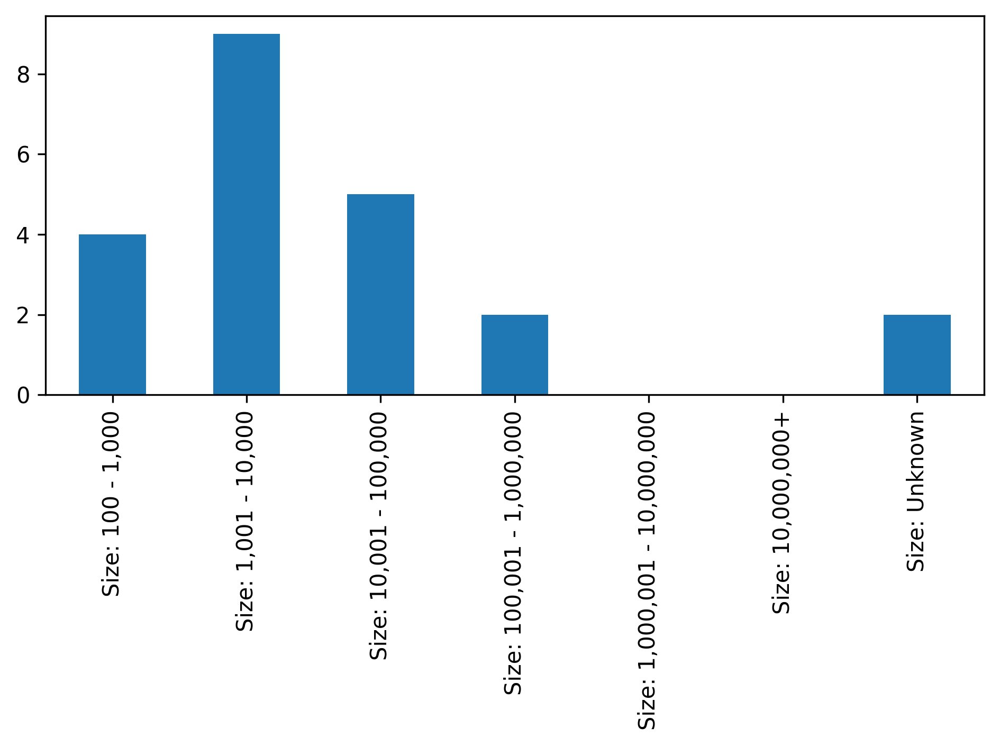

In [52]:
# Size histogram
council_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'all_councils_size_histogram.png')
plt.show()

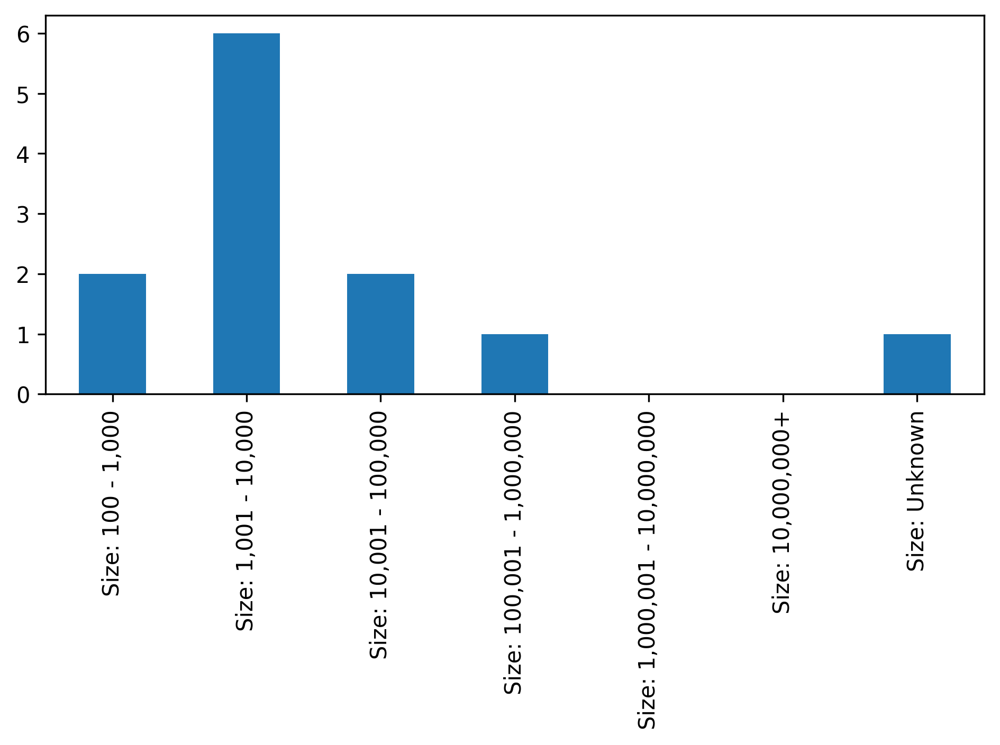

In [53]:
# Size histogram
local_councils_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'local_councils_size_histogram.png')

plt.show()

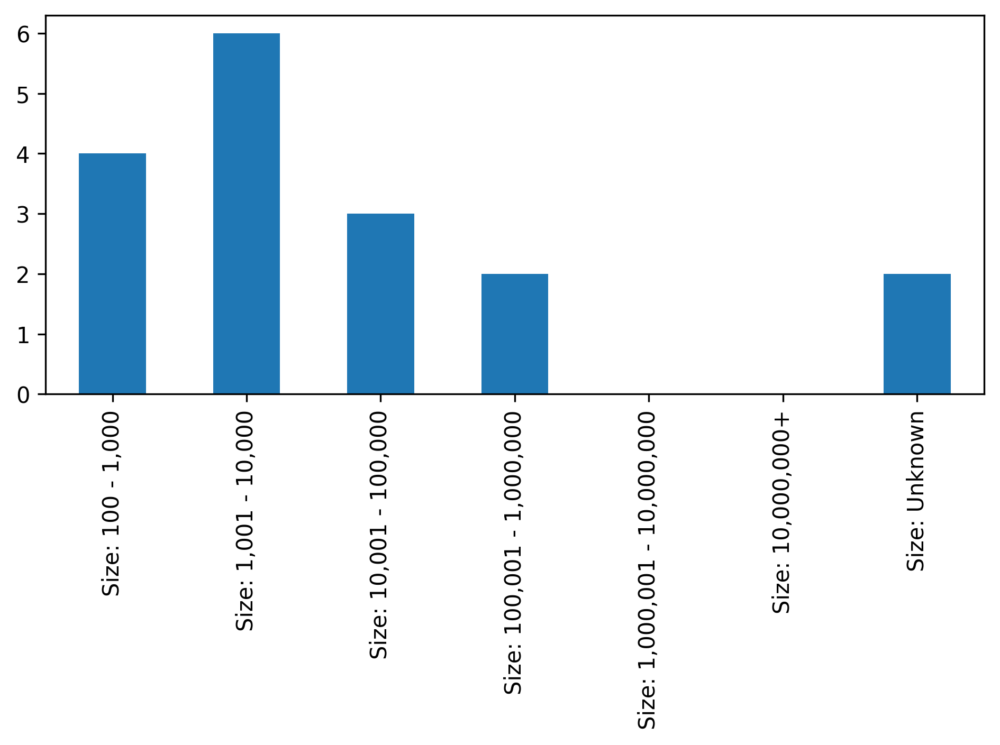

In [54]:
# Size histogram
central_councils_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'central_councils_size_histogram.png')
plt.show()

In [55]:
size_councils_corr = councils_corr[councils_corr.index.str.startswith('Size:')]

In [56]:
size_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
"Size: 100 - 1,000",0.012114,0.271513
"Size: 1,001 - 10,000",0.142936,-0.198669
"Size: 10,001 - 100,000",-0.204421,-0.310412
"Size: 100,001 - 1,000,000",0.041133,0.276131
"Size: 1,000,001 - 10,000,000",NaN,NaN
"Size: 10,000,000+",NaN,NaN
Size: Unknown,0.024052,0.248216


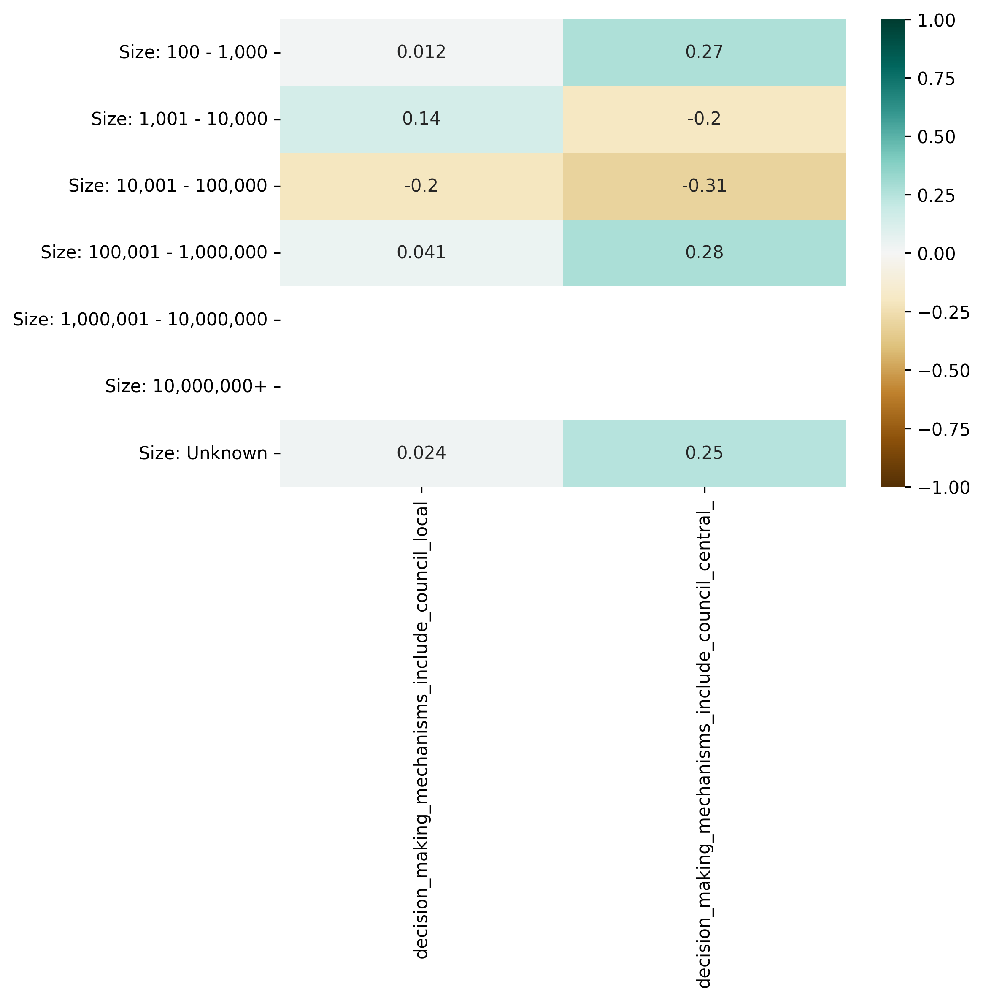

In [57]:
plt.figure(figsize=(8,8))
sns.heatmap(
    size_councils_corr, 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'councils_size_corr.png')
plt.show()

## Councils Analysis: Region

In [58]:
region_cols = [col for col in col_list if col.startswith('Region:')]
region_cols

['Region: Africa',
 'Region: Europe',
 'Region: Asia',
 'Region: Middle East',
 'Region: North America',
 'Region: Central America',
 'Region: South America',
 'Region: Oceania']

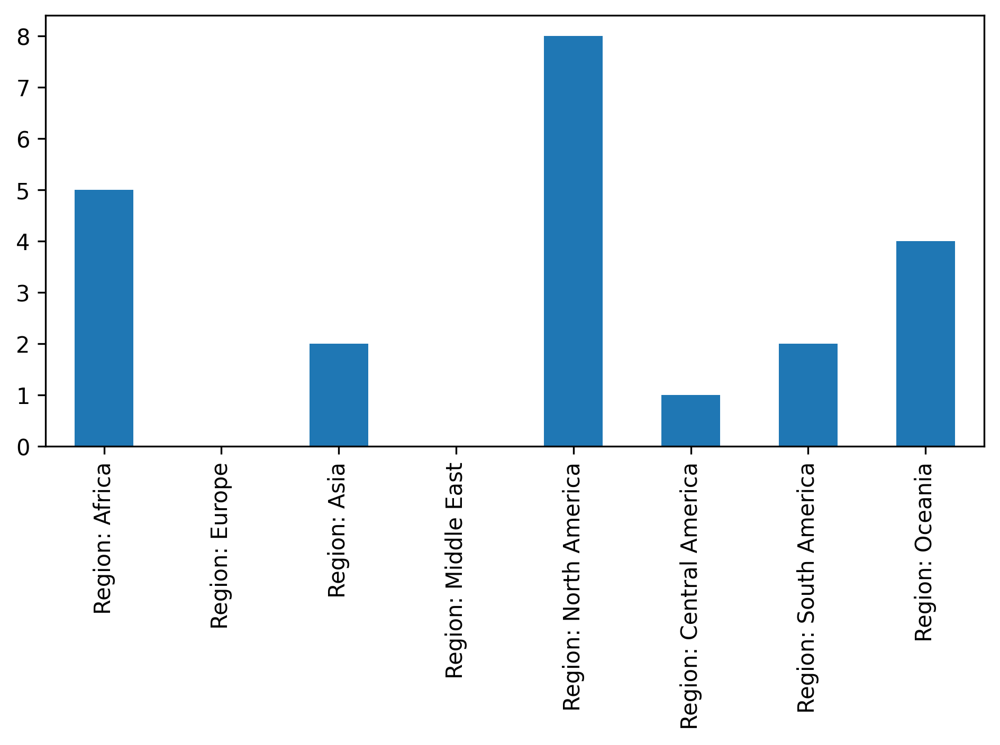

In [59]:
# Region histogram
council_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'all_councils_region_histogram.png')
plt.show()

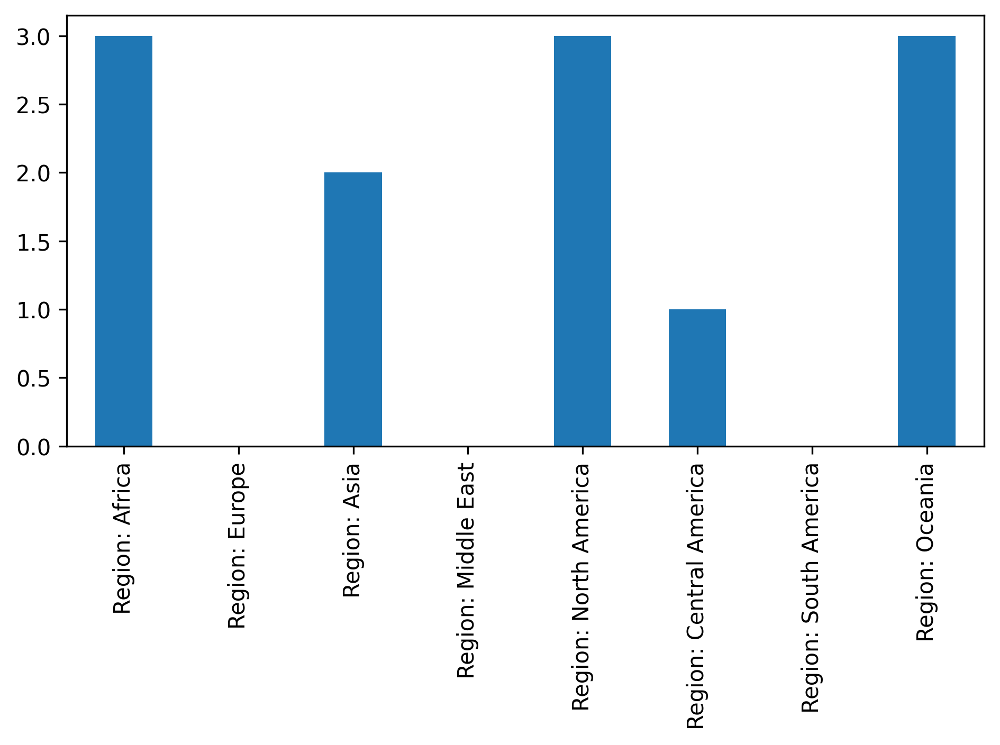

In [60]:
# Region histogram
local_councils_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'local_councils_region_histogram.png')
plt.show()

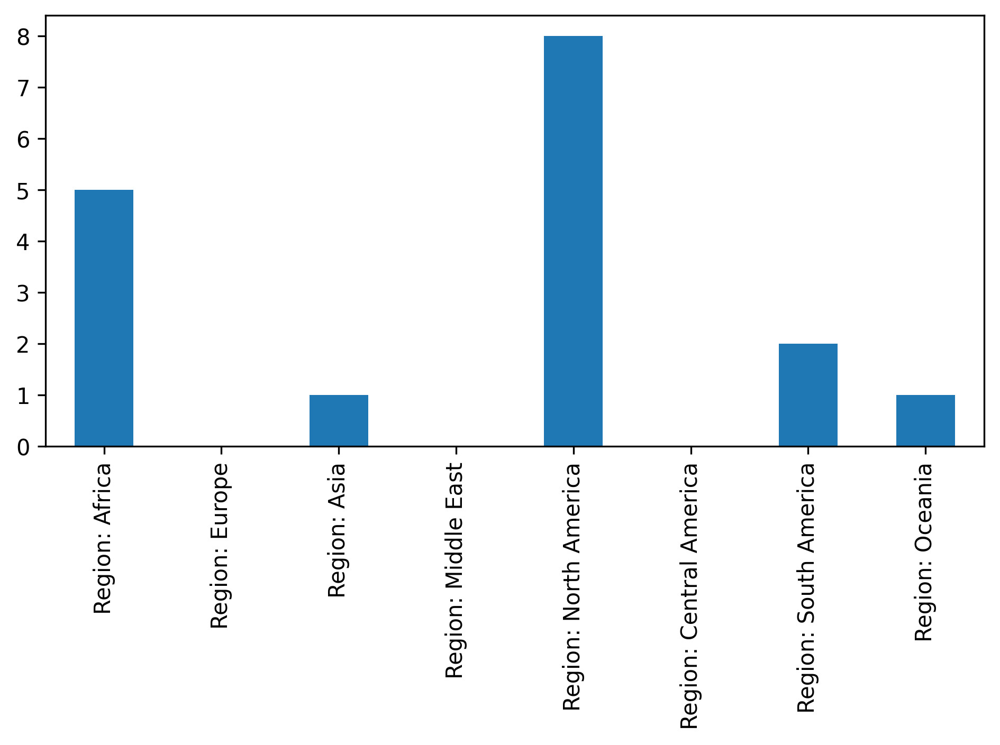

In [61]:
# Region histogram
central_councils_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'central_councils_region_histogram.png')
plt.show()

In [62]:
region_councils_corr = councils_corr[councils_corr.index.str.startswith('Region:')]

In [63]:
region_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
Region: Africa,0.180279,0.400561
Region: Europe,NaN,NaN
Region: Asia,0.118234,-0.261287
Region: Middle East,NaN,NaN
Region: North America,-0.194105,0.320525
Region: Central America,0.198494,-0.273591
Region: South America,-0.332312,0.063017
Region: Oceania,0.141212,-0.478445


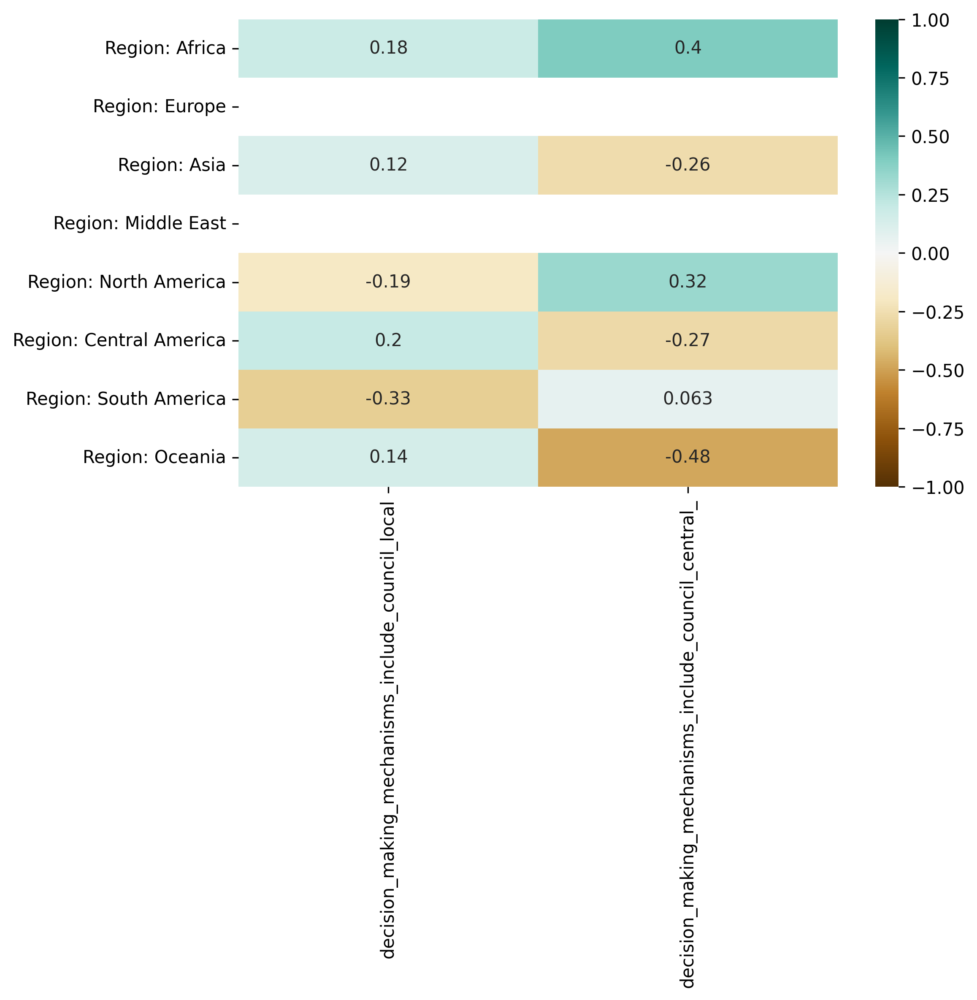

In [64]:
plt.figure(figsize=(8,8))
sns.heatmap(
    region_councils_corr, 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig(fig_dir + 'councils_region_corr.png')
plt.show()

### Mapping council regions

In [65]:
worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

worldmap.head()

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_68484/1532259957.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [66]:
central_america_countries = [
    'Belize',
    'Costa Rica',
    'El Salvador',
    'Guatemala',
    'Honduras',
    'Nicaragua',
    'Panama'
]

middle_east_countries = [
    'Cyprus',
    'Egypt',
    'Iran',
    'Iraq',
    'Israel',
    'Jordan',
    'Kuwait',
    'Lebanon',
    'Oman',
    'Palestine',
    'Qatar',
    'Saudi Arabia',
    'Syria',
    'Turkey',
    'United Arab Emirates',
    'Yemen'
]

# Add region for Central America
worldmap.loc[(worldmap['name'].isin(central_america_countries)), 'continent'] = 'Central America'

# Add region for Middle East
worldmap.loc[(worldmap['name'].isin(middle_east_countries)), 'continent'] = 'Middle East'

worldmap['continent'].value_counts()

continent
Africa                     50
Europe                     39
Asia                       32
Middle East                16
South America              13
North America              11
Oceania                     7
Central America             7
Seven seas (open ocean)     1
Antarctica                  1
Name: count, dtype: int64

In [67]:
region_map = gpd.GeoDataFrame(columns=['Region', 'geometry'])
regions_list = list(gov_df['Region'].unique())

In [68]:
region_map['Region'] = regions_list

region_map['geometry'].loc[region_map['Region'] == 'Africa'] = worldmap.loc[(worldmap['continent'] == 'Africa')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Europe'] = worldmap.loc[(worldmap['continent'] == 'Europe')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Asia'] = worldmap.loc[(worldmap['continent'] == 'Asia')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Middle East'] = worldmap.loc[(worldmap['continent'] == 'Middle East')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'North America'] = worldmap.loc[(worldmap['continent'] == 'North America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Central America'] = worldmap.loc[(worldmap['continent'] == 'Central America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'South America'] = worldmap.loc[(worldmap['continent'] == 'South America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Oceania'] = worldmap.loc[(worldmap['continent'] == 'Oceania')].unary_union

region_map

,Region,geometry
0,South America,"MULTIPOLYGON (((-68.63999 -55.58002, -69.23210..."
1,Oceania,"MULTIPOLYGON (((147.91405 -43.21152, 147.56456..."
2,Asia,"MULTIPOLYGON (((105.85745 -4.30552, 105.81766 ..."
3,Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6..."
4,North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421..."
5,Central America,"POLYGON ((-77.24257 7.93528, -77.43111 7.63806..."


#### All Councils

In [69]:
all_councils_region_map = region_map

In [70]:
councils_region_counts = council_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [71]:
councils_region_counts

,Region,Count
0,North America,8
1,Africa,5
2,Oceania,4
3,South America,2
4,Asia,2
5,Central America,1


In [72]:
all_merged_regions = pd.merge(all_councils_region_map, councils_region_counts, on='Region')

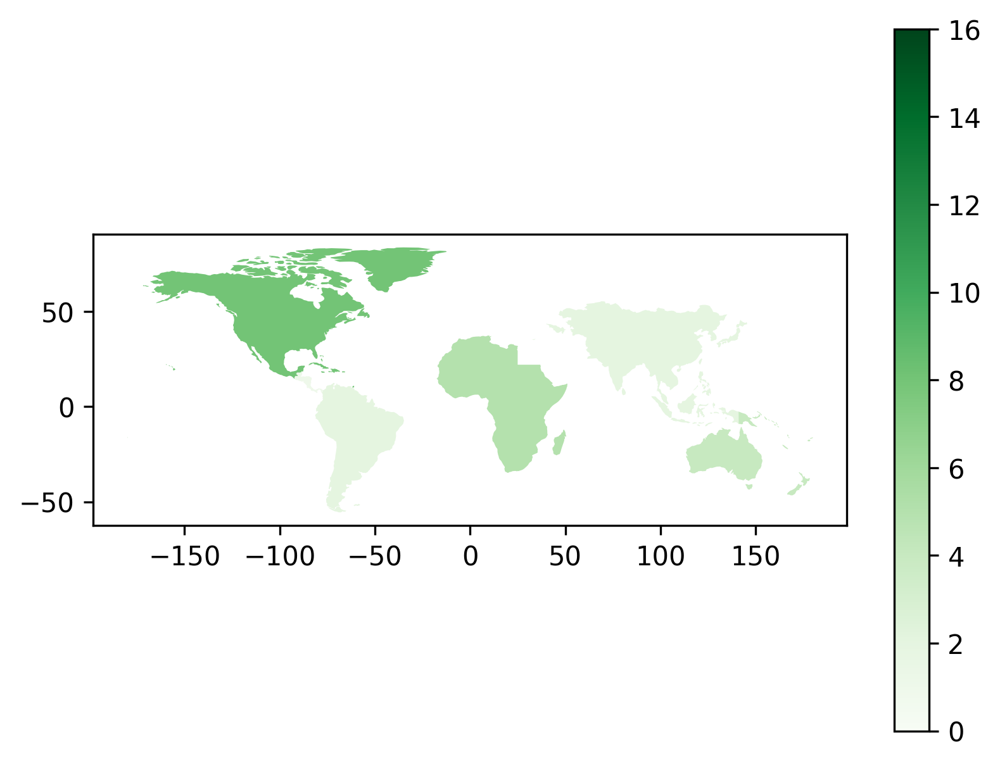

In [73]:
all_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig(fig_dir + 'map_councils_all.png')
plt.show()

#### Local Councils

In [74]:
local_councils_region_map = region_map

In [75]:
local_councils_region_counts = local_councils_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [76]:
local_councils_region_counts

,Region,Count
0,Oceania,3
1,Africa,3
2,North America,3
3,Asia,2
4,Central America,1


In [77]:
local_merged_regions = pd.merge(local_councils_region_map, local_councils_region_counts, on='Region')

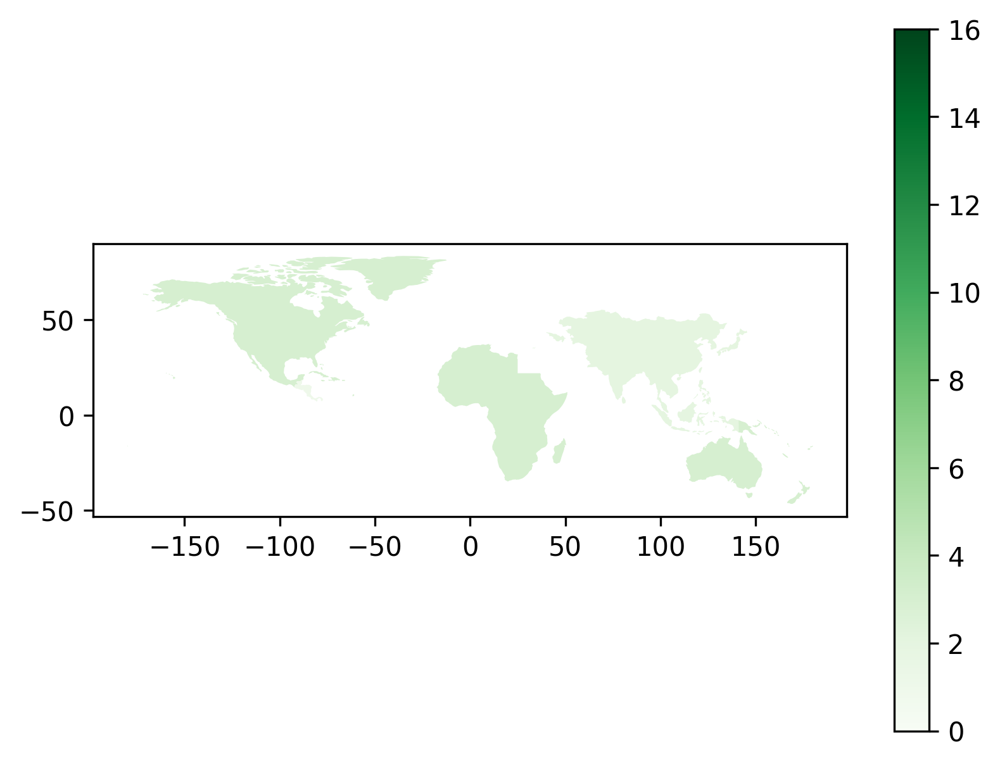

In [78]:
local_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig(fig_dir + 'map_councils_local.png')
plt.show()

#### Central Councils

In [79]:
central_councils_region_map = region_map

In [80]:
central_councils_region_counts = central_councils_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [81]:
central_councils_df.loc[central_councils_df['Name'] == 'Pawnee']

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,decision_making_mechanisms_include_representation,enforcement_mechanisms_include_police,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_bureaucracy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_petition,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_lobbying,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_gathering,access_mechanisms_include_female_participation,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,access_mechanisms_include_induction_rite_ceremony,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_assembly_local,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,enforcement_mechanisms_include_arbitration,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,access_mechanisms_include_property_requirement,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_checks_and_balances,decision_making_mechanisms_include_consensus,access_mechanisms_include_child_participation,enforcement_mechanisms_include_exit,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_secret_ballot,access_mechanisms_include_meritocracy,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_co-optation,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_kingchief-as-figurehead,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_consent,enforcement_mechanisms_include_negotiation,enforcement_mechanisms_include_graduated_sanctions,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_capital_punishment,enforcement_mechanisms_include_self-help,enforcement_mechanisms_include_mediation,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_assembly_central,access_mechanisms_include_heredity,decision_making_mechanisms_include_balance_of_power,decision_making_mechanisms_include_ratification_acclamation_only,access_mechanisms_include_election,access_mechanisms_include_matriarchy,access_mechanisms_include_gerontocracy,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_forced_labour,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_autocra

In [82]:
central_councils_region_counts

,Region,Count
0,North America,8
1,Africa,5
2,South America,2
3,Oceania,1
4,Asia,1


In [83]:
central_merged_regions = pd.merge(central_councils_region_map, central_councils_region_counts, on='Region')

In [84]:
central_merged_regions

,Region,geometry,Count
0,South America,"MULTIPOLYGON (((-68.63999 -55.58002, -69.23210...",2
1,Oceania,"MULTIPOLYGON (((147.91405 -43.21152, 147.56456...",1
2,Asia,"MULTIPOLYGON (((105.85745 -4.30552, 105.81766 ...",1
3,Africa,"MULTIPOLYGON (((-11.43878 6.78592, -11.70819 6...",5
4,North America,"MULTIPOLYGON (((-155.22217 19.23972, -155.5421...",8


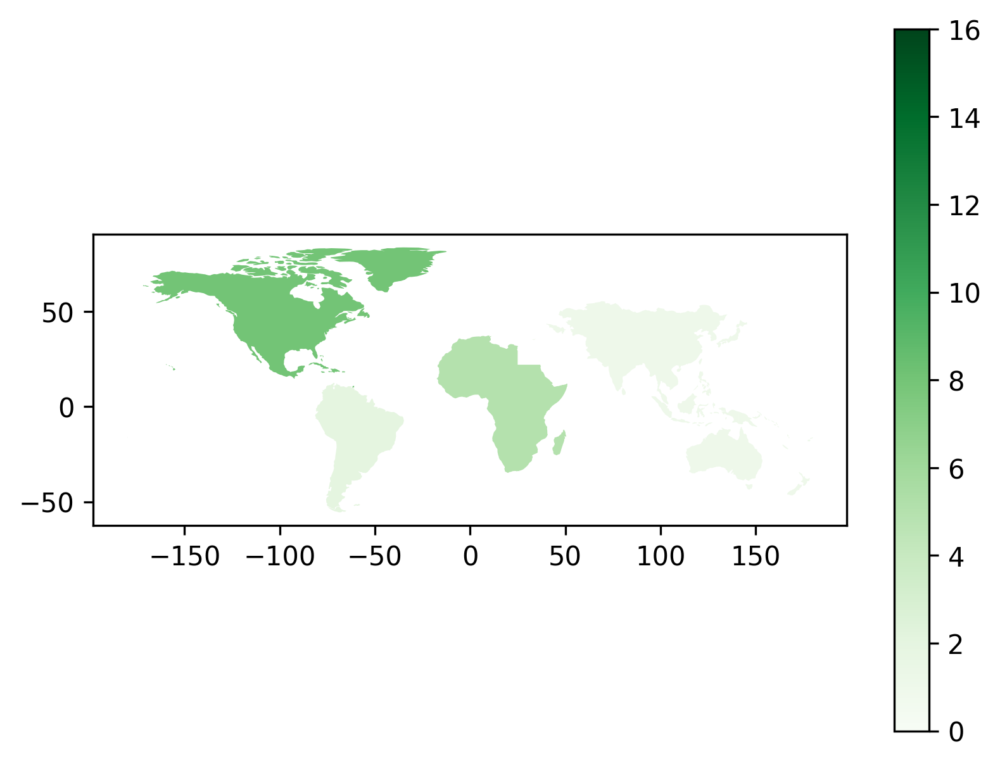

In [85]:
central_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig(fig_dir + 'map_councils_central.png')
plt.show()

## Councils Analysis: Timeline 

In [86]:
council_dates_df = council_df[['Time span: Start', 'Time span: Duration', 'Name'] + council_cols]

In [87]:
council_dates_df

,Time span: Start,Time span: Duration,Name,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
65,1700,200,Tehuelche,0,1
66,1500,100,Tupinamba,0,1
68,1700,150,Ajie,1,0
70,1800,100,Marquesans,0,1
71,1800,100,Samoans,1,0
72,1400,500,Gilbertese,1,0
73,1800,100,Toda,1,1
74,1600,400,Nicobarese,1,0
76,1800,100,Nama,0,1
77,1500,300,Thonga (Tsonga),1,1


In [88]:
council_dates_tuples = [tuple(x) for x in council_dates_df.to_numpy()]
council_dates_tuples

[(1700, 200, 'Tehuelche', 0, 1),
 (1500, 100, 'Tupinamba', 0, 1),
 (1700, 150, 'Ajie', 1, 0),
 (1800, 100, 'Marquesans', 0, 1),
 (1800, 100, 'Samoans ', 1, 0),
 (1400, 500, 'Gilbertese', 1, 0),
 (1800, 100, 'Toda', 1, 1),
 (1600, 400, 'Nicobarese', 1, 0),
 (1800, 100, 'Nama', 0, 1),
 (1500, 300, 'Thonga (Tsonga)', 1, 1),
 (1600, 200, 'Ashanti', 1, 1),
 (1500, 200, 'Masai', 0, 1),
 (1200, 650, 'Somali', 1, 1),
 (1800, 100, "Ingalik [Deg Xit'an]", 0, 1),
 (1700, 200, 'Kutenai', 0, 1),
 (1500, 500, "Micmac [Mi'kmaq]", 1, 1),
 (1700, 150, 'Hidatsa', 1, 1),
 (1750, 100, 'Pawnee', 0, 1),
 (1700, 180, 'Omaha', 0, 1),
 (1800, 100, 'Twana', 1, 1),
 (1800, 100, 'Comanche', 0, 1),
 (1800, 100, 'Huichol', 1, 0)]

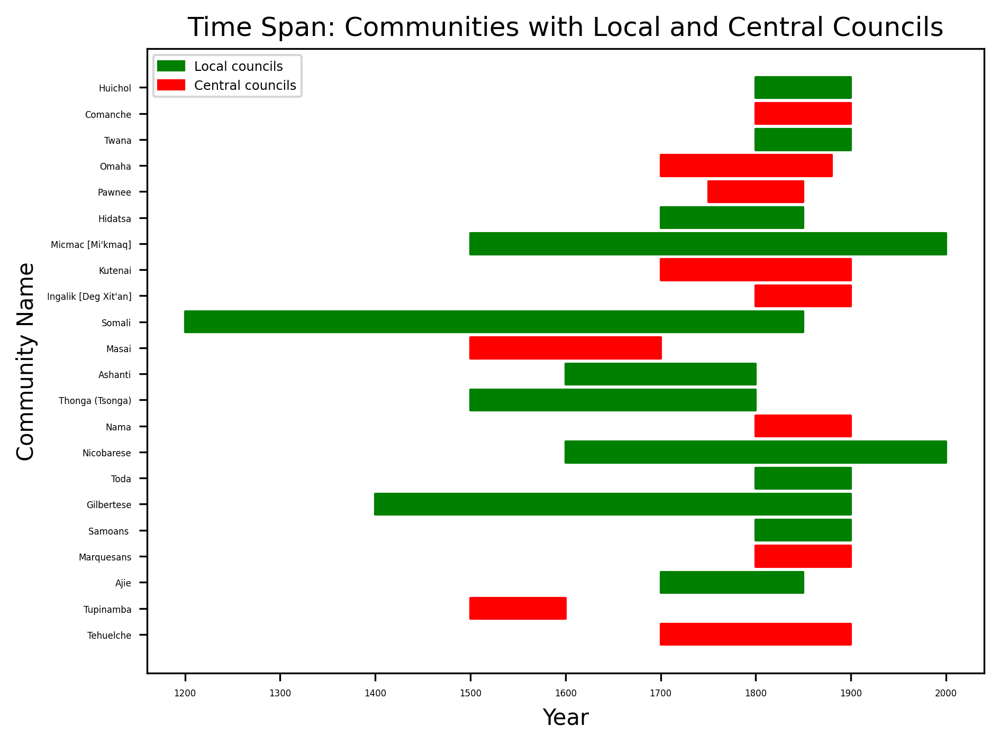

In [89]:
# create figure and plot
fig, ax = plt.subplots()
labels = []
for i, (
    start, 
    duration, 
    label, 
    is_local,
    is_central, 
) in enumerate(council_dates_tuples):
    if is_local:
        bar_color = 'green'
    elif is_central:
        bar_color = 'red'
    else:
        bar_color = 'grey' 
    
    labels.append(label)
    ax.broken_barh(
        [(start, duration)], 
        (i-0.4,0.8),
        color=bar_color
    )
    
# set yticks at the middle of the bars
ax.set_yticks(range(len(council_dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='both', which='major', labelsize=4)

ax.set_xlabel('Year')
ax.set_ylabel('Community Name')

plt.title('Time Span: Communities with Local and Central Councils')
# plt.figure(figsize=(80, 80))

# Create legend
red_patch = mpatches.Patch(color='green', label='Local councils')
yellow_patch = mpatches.Patch(color='red', label='Central councils')

ax.legend(
    handles=[
        red_patch,
        yellow_patch,
    ],
    loc='upper left',
    fontsize='xx-small'
)

plt.tight_layout()
plt.savefig(fig_dir + 'timeline_councils.png')
plt.show()